In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, DBSCAN
sns.set()
%matplotlib inline

In [2]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn import preprocessing

In [3]:
import pwlf

In [4]:
plt.rcParams['figure.figsize'] = [16, 9]

In [5]:
w = pd.read_csv(r'The revised 292 F - 2018-12-31.csv',parse_dates=['Timestamp'], index_col='Timestamp')

In [6]:
w = (w - 32)/1.8
w = w.round(2)

In [7]:
e = pd.read_csv(r'afterQ295(Dec2).csv',parse_dates=['Timestamp'], index_col='Timestamp')

<AxesSubplot:xlabel='Timestamp'>

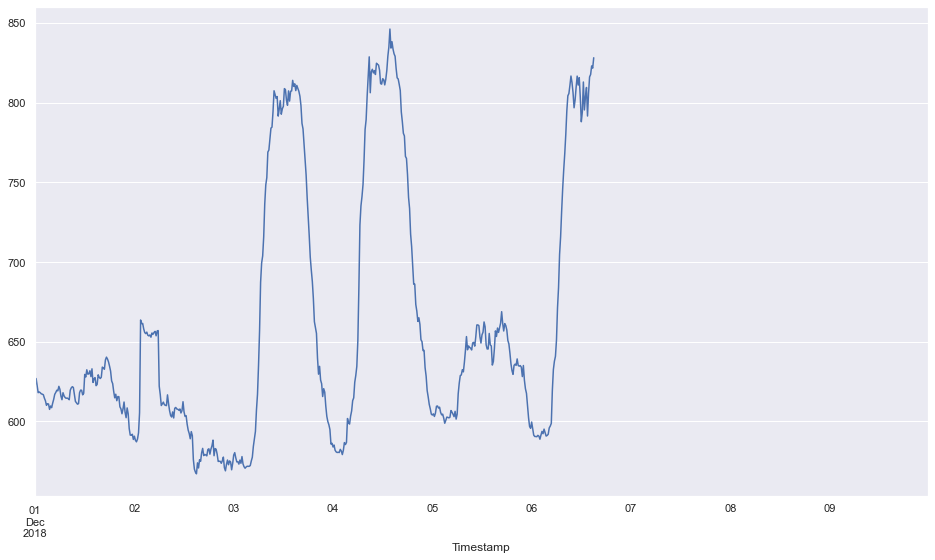

In [8]:
e['DC0459AF']['2018-12'].plot()

<AxesSubplot:xlabel='Timestamp'>

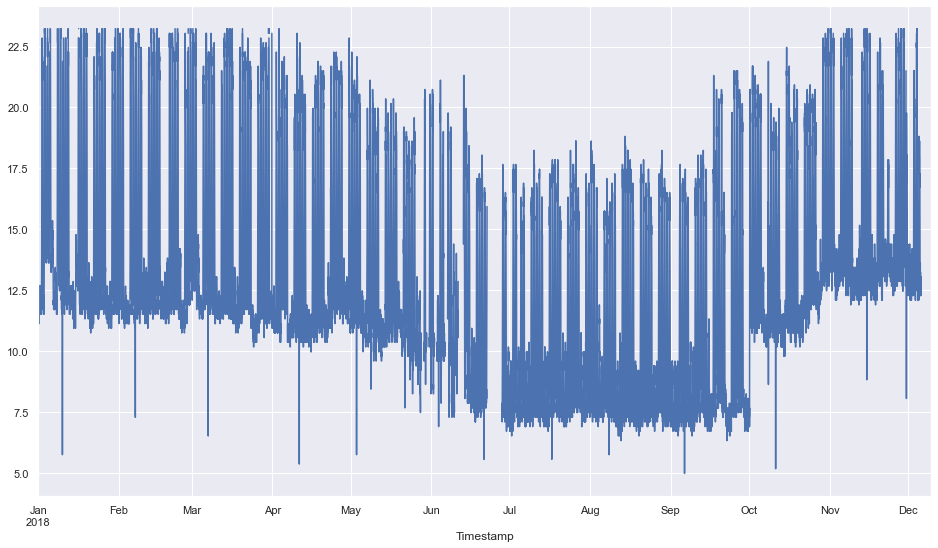

In [9]:
e['AK0001ZZ'].plot()

In [10]:
building_list = pd.read_excel('Revised startup and shutdown time all categories.xlsx', sheet_name='Office')
building_4A = building_list[building_list['Climate Zone'] == '4A']
buildings = building_4A['Building ID']

In [11]:
buildings = np.unique(buildings)

In [12]:
len(buildings)

37

In [13]:
buildings = buildings[buildings != 'MD0325ZZ']

In [14]:
building_info = pd.read_excel('extracted data of 295 buildings.xlsx',  index_col=0)

In [15]:
building_info['code']

0      AK0001ZZ
1      AK0013ZZ
2      AK0031AA
3      AL0003AC
4      AL0011ZZ
         ...   
290    IL0303ZZ
291    IL0311ZZ
292    IL2125ZZ
293    IN0031ZZ
294    KY0013ZZ
Name: code, Length: 295, dtype: object

In [16]:
(building_info['year'] < 1960).sum()

100

In [17]:
(building_info['year'] > 2000).sum()

28

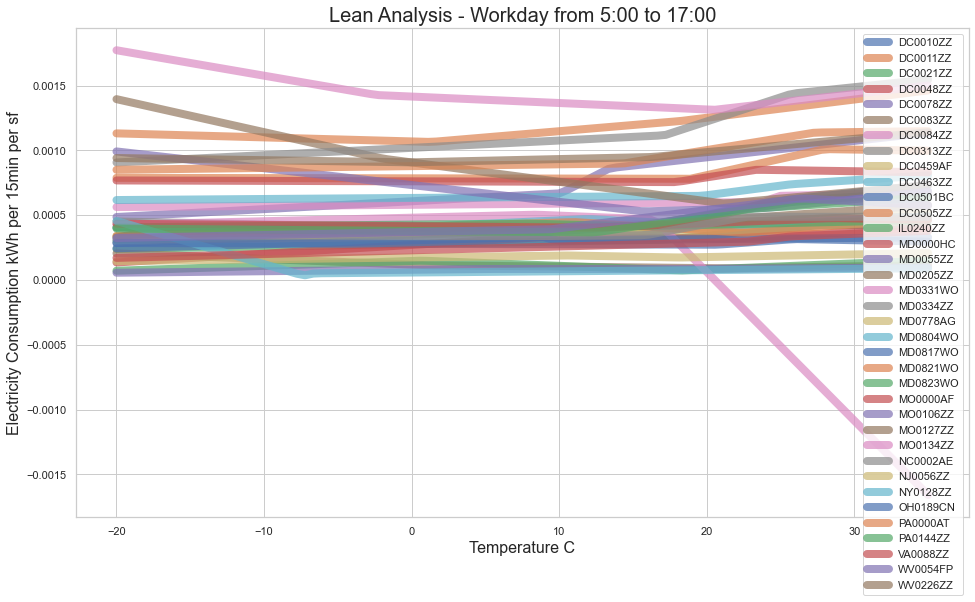

In [22]:
sns.set_style("whitegrid")
for i in buildings:
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[data.index.weekday < 5].between_time('5:00', '17:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(3)
    x_ = np.linspace(-20, 35, 100)
    plt.plot(x_, f.predict(x_), label=i, alpha=0.7, lw=8)
    plt.legend(loc='upper right')
    plt.title(f'Lean Analysis - Workday from 5:00 to 17:00', fontsize=20)
    plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
    plt.xlabel('Temperature C', fontsize=16)

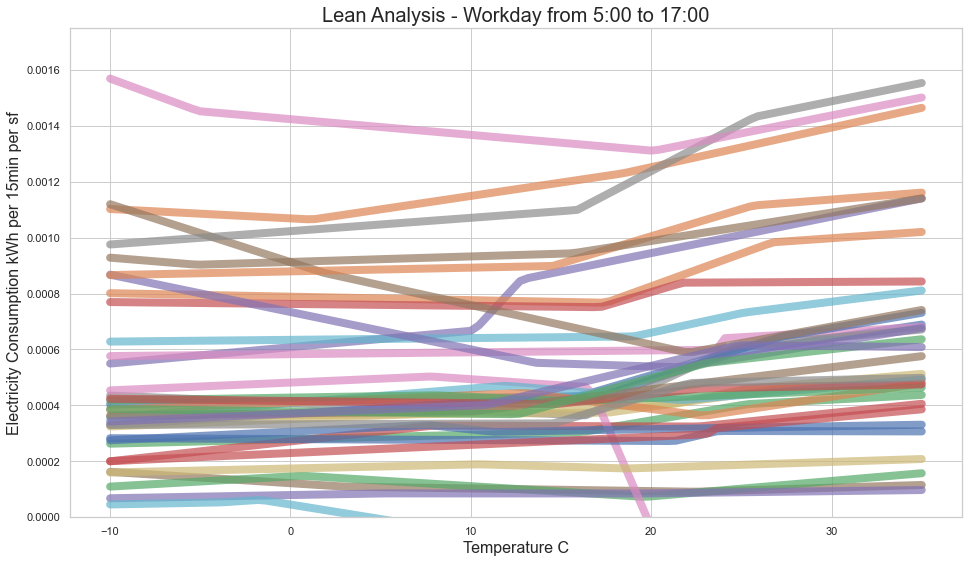

In [25]:
sns.set_style("whitegrid")
for i in buildings:
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
#     data = data[data > 0]
    data = data.dropna()
    data = data[data.index.weekday < 5].between_time('5:00', '17:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(3)
    x_ = np.linspace(-10, 35, 100)
    plt.plot(x_, f.predict(x_), label=i, alpha=0.7, lw=8)
#     plt.legend(loc='upper right')
    plt.title(f'Lean Analysis - Workday from 5:00 to 17:00', fontsize=20)
    plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
    plt.xlabel('Temperature C', fontsize=16)
    plt.ylim(0, 0.00175)

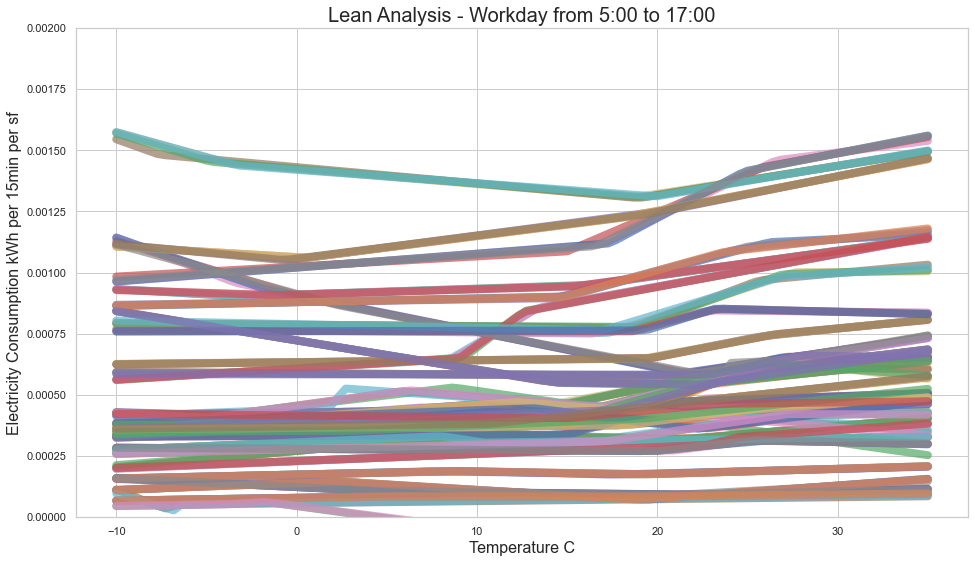

In [28]:
sns.set_style("whitegrid")
for i in buildings:
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
#     data = data[data > 0]
    data = data.dropna()
    data = data[data.index.weekday < 5].between_time('5:00', '17:00')
    
    clustering = DBSCAN(eps=5, min_samples=5).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(3)
    x_ = np.linspace(-10, 35, 100)
    plt.plot(x_, f.predict(x_), label=i, alpha=0.7, lw=8)
#     plt.legend(loc='upper right')
    plt.title(f'Lean Analysis - Workday from 5:00 to 17:00', fontsize=20)
    plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
    plt.xlabel('Temperature C', fontsize=16)
    plt.ylim(0, 0.00175)

<ipython-input-14-195101c2baa3>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.subplots()


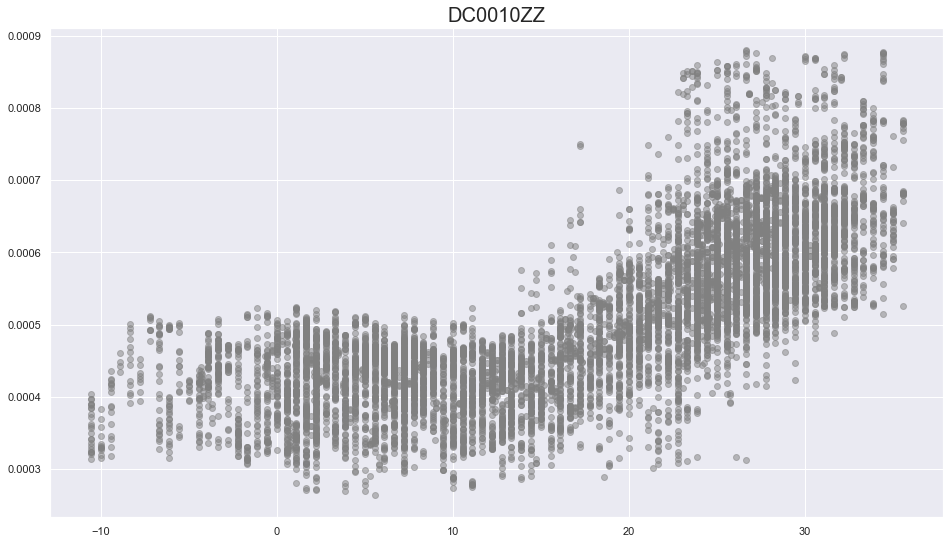

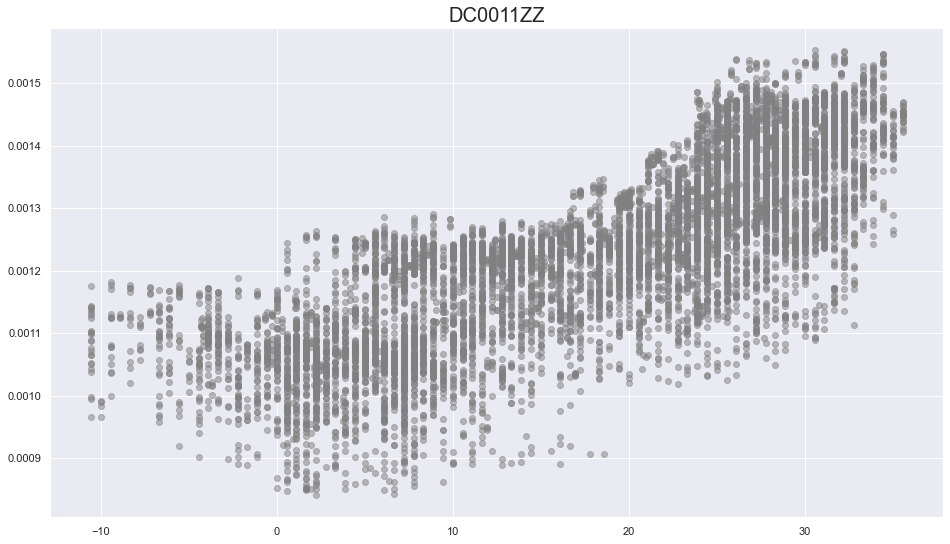

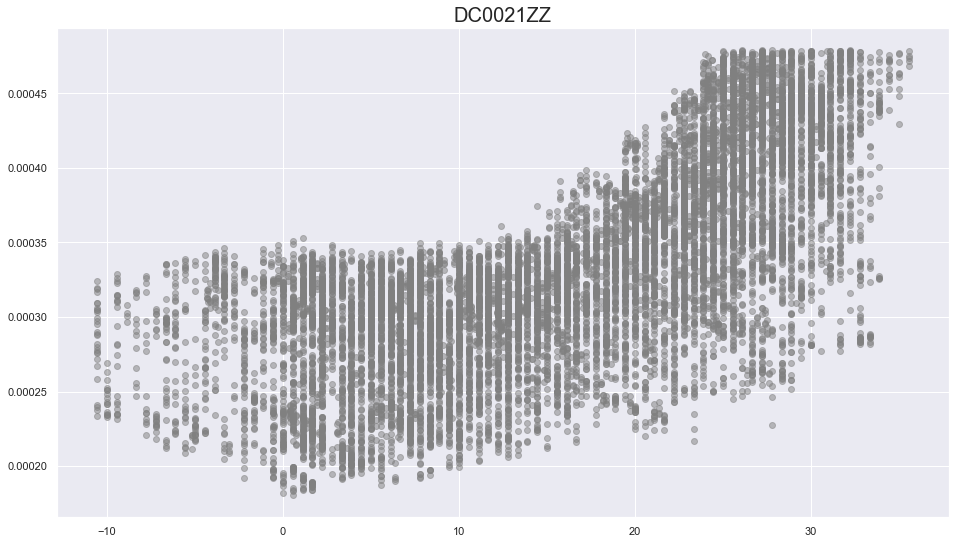

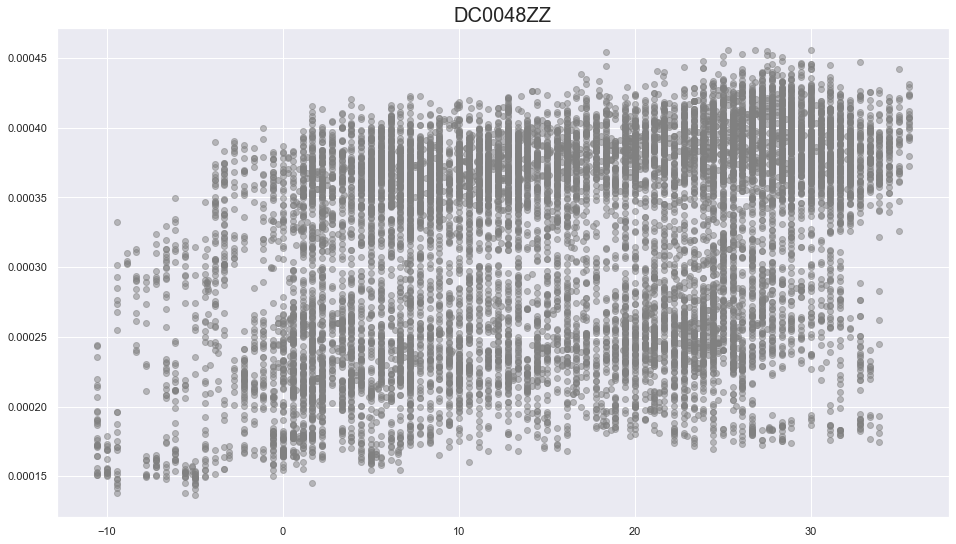

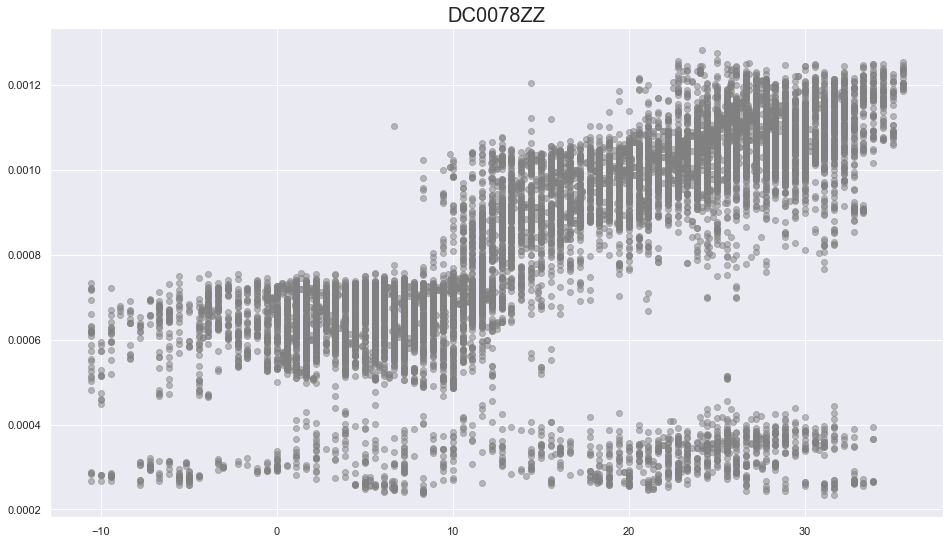

...

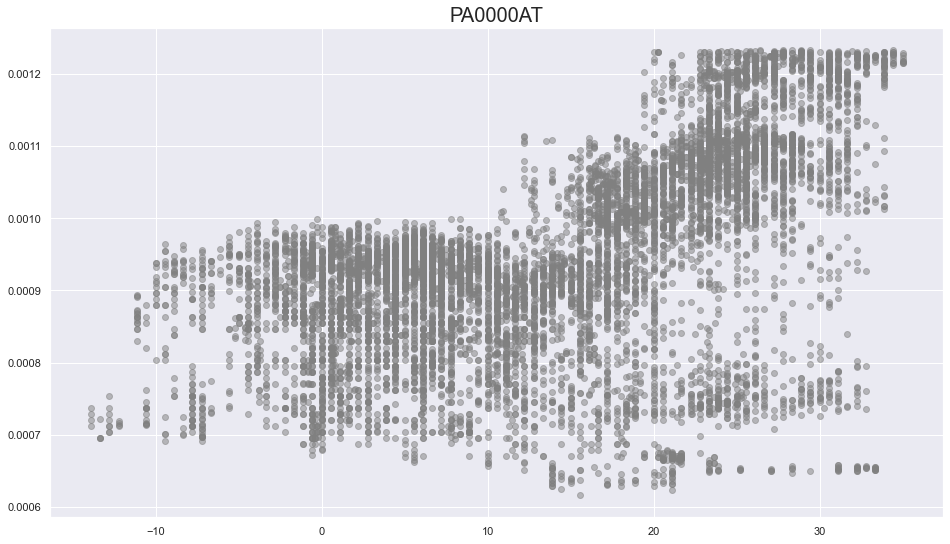

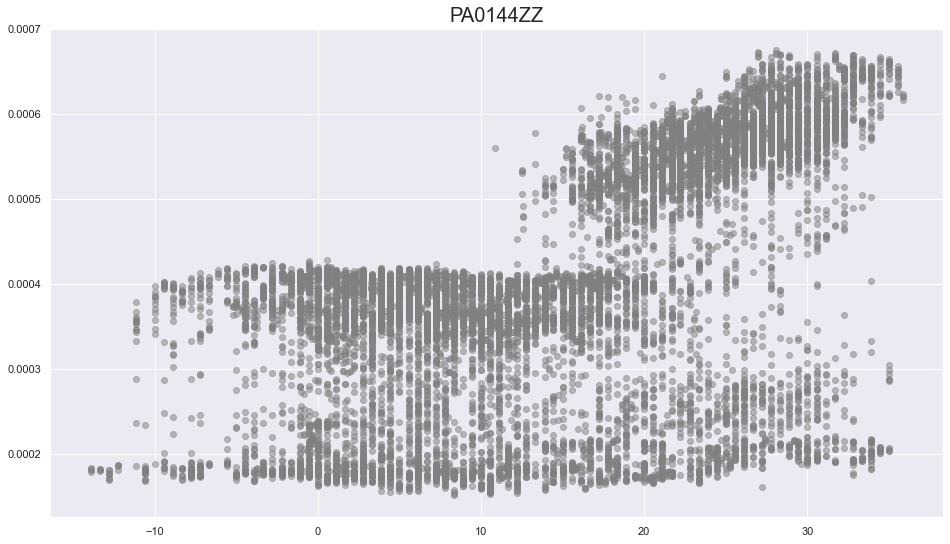

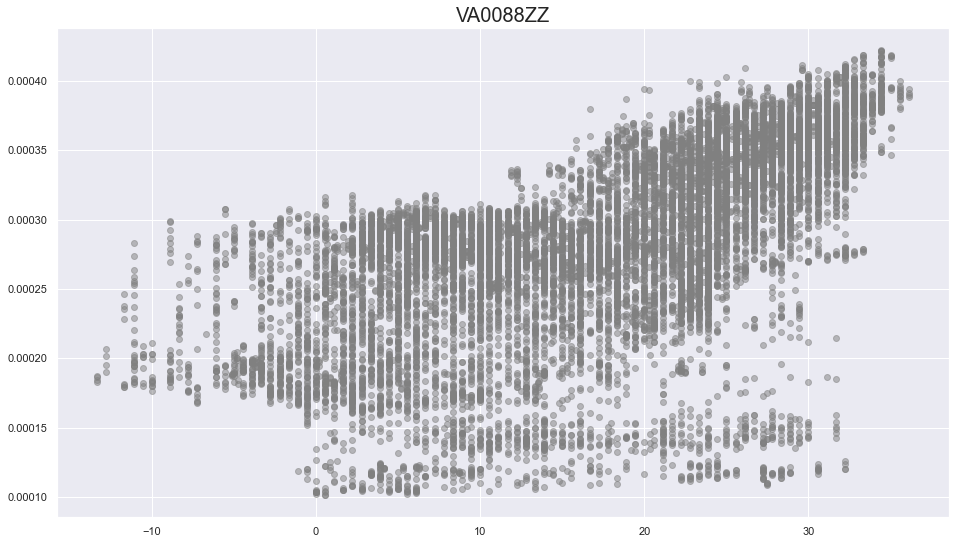

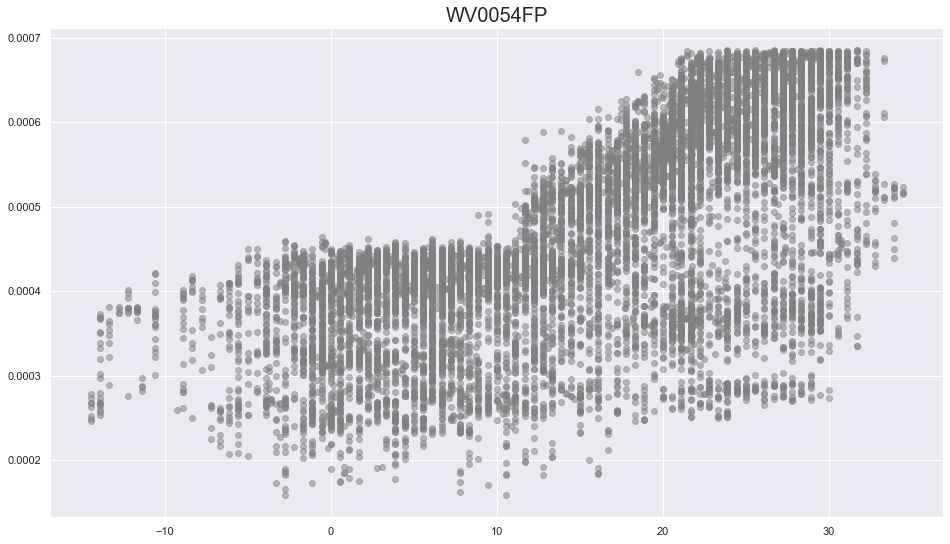

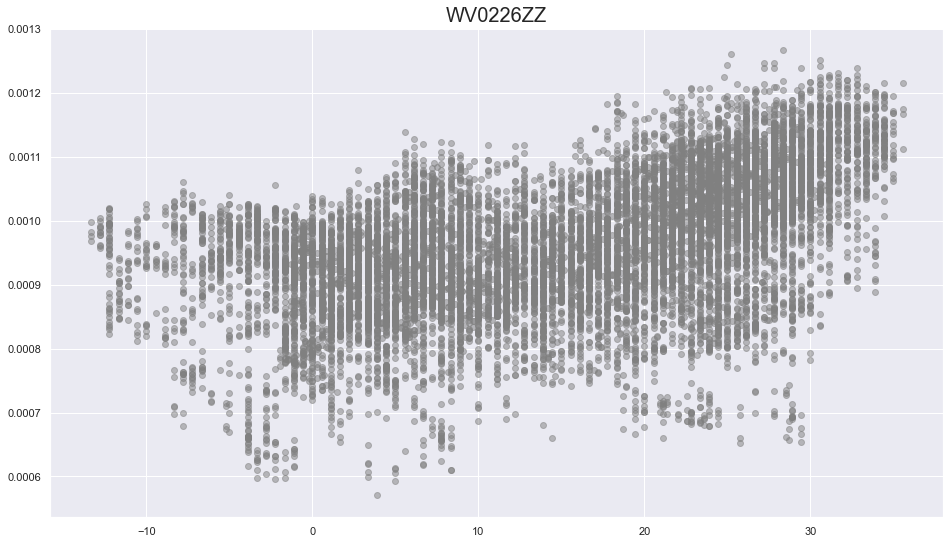

In [14]:
for i in buildings:
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[data.index.weekday < 5].between_time('5:00', '19:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
#     f = pwlf.PiecewiseLinFit(x, y)
#     res = f.fit(3)
    plt.subplots()
    plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='gray', alpha=0.5)
#     plt.scatter(x, f.predict(x))
    plt.title(f'{i}', fontsize=20)

In [24]:
segment = {'DC0010ZZ': 2,
           'DC0011ZZ': 2,
           'DC0021ZZ': 2,
           'DC0078ZZ': 2,
           'DC0313ZZ': 2,
           'DC0459AF': 2,
           'DC0463ZZ': 2,
           'DC0501BC': 2,
           'DC0505ZZ': 2,
           'MD0000HC': 2,
           'MD0205ZZ': 2,
           'MD0334ZZ': 2,
           'MD0778AG': 2,
           'MO0000AF': 2,
           'MO0106ZZ': 3,
           'MO0127ZZ': 2,
           'MO0134ZZ': 3,
           'NC0002AE': 2,
           'NJ0056ZZ': 2,
           'PA0000AT': 2,
           'PA0144ZZ': 2,
           'VA0088ZZ': 2,
           'WV0054FP': 2,
           'WV0226ZZ': 2}

In [20]:
list(segment.keys())

['DC0010ZZ',
 'DC0011ZZ',
 'DC0021ZZ',
 'DC0078ZZ',
 'DC0313ZZ',
 'DC0459AF',
 'DC0463ZZ',
 'DC0501BC',
 'DC0505ZZ',
 'MD0000HC',
 'MD0205ZZ',
 'MD0334ZZ',
 'MD0778AG',
 'MO0000AF',
 'MO0106ZZ',
 'MO0127ZZ',
 'MO0134ZZ',
 'NC0002AE',
 'NJ0056ZZ',
 'PA0000AT',
 'PA0144ZZ',
 'VA0088ZZ',
 'WV0054FP',
 'WV0226ZZ']

<ipython-input-25-eefb880e9f01>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.subplots()


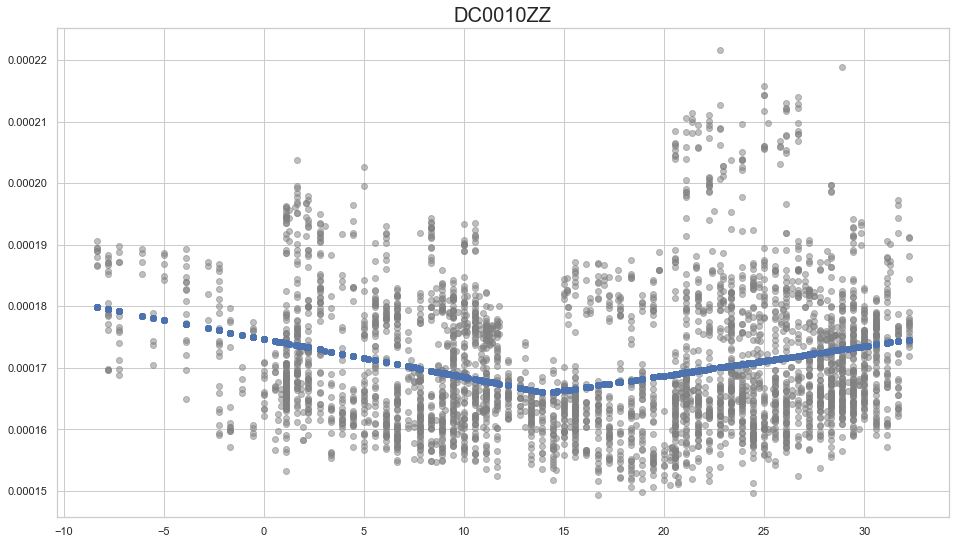

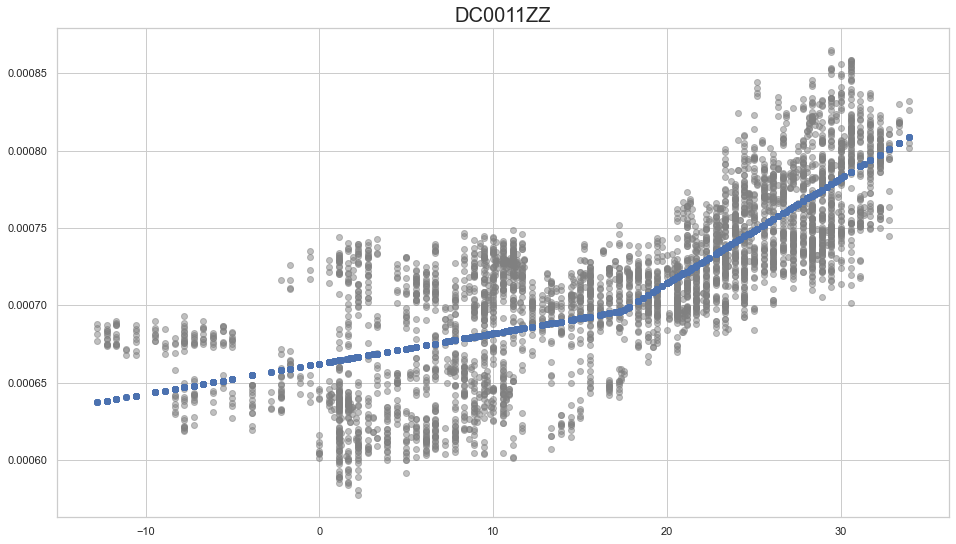

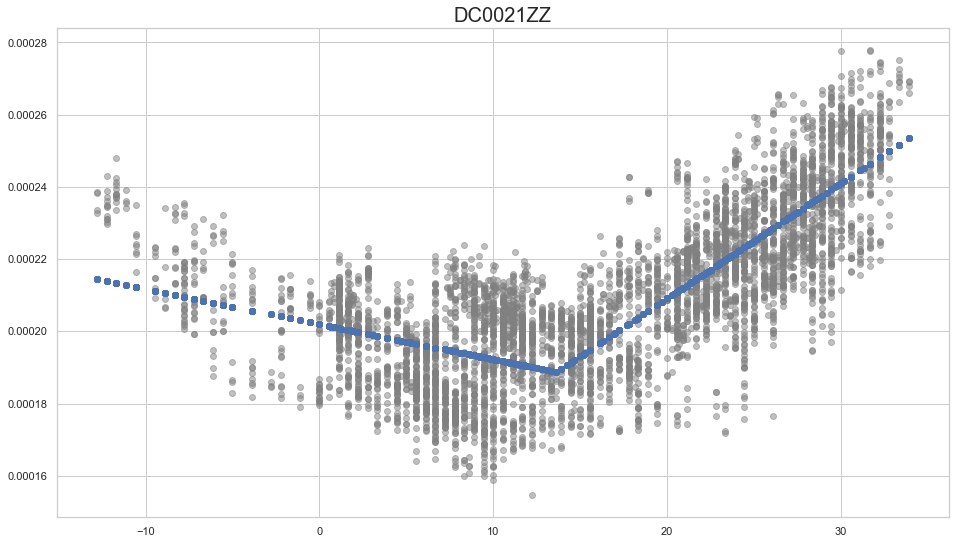

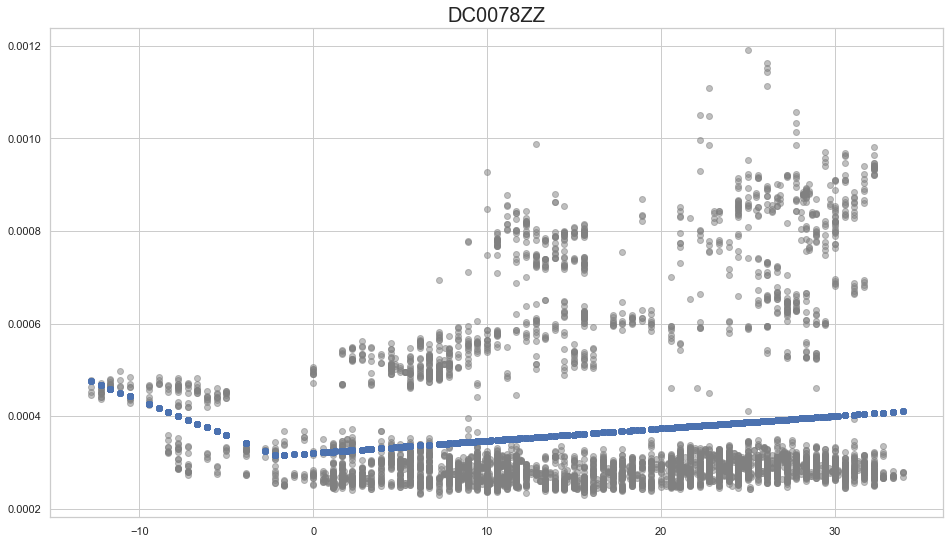

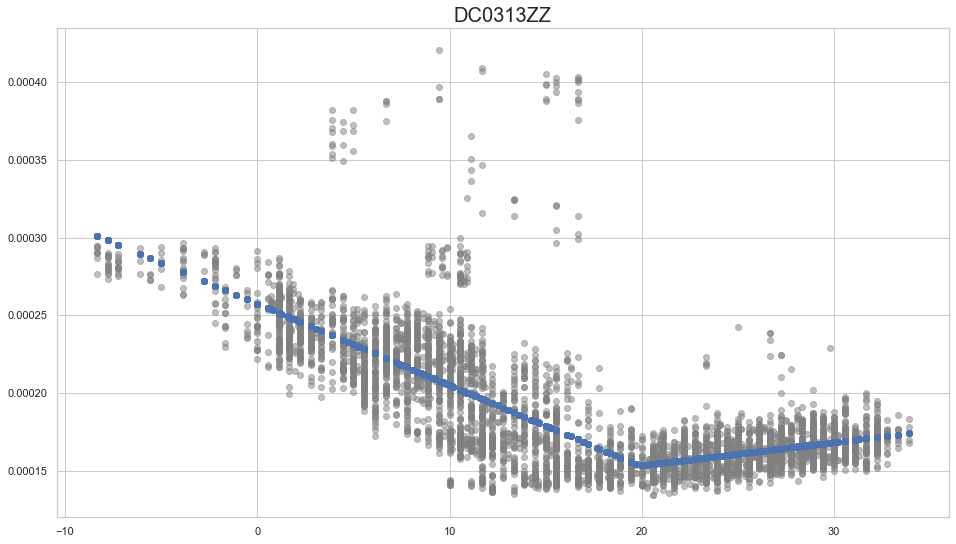

...

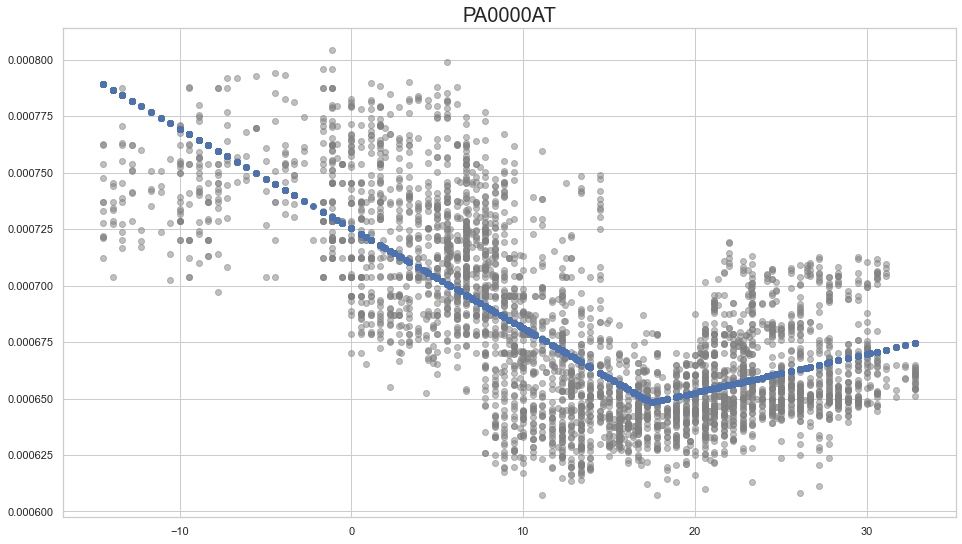

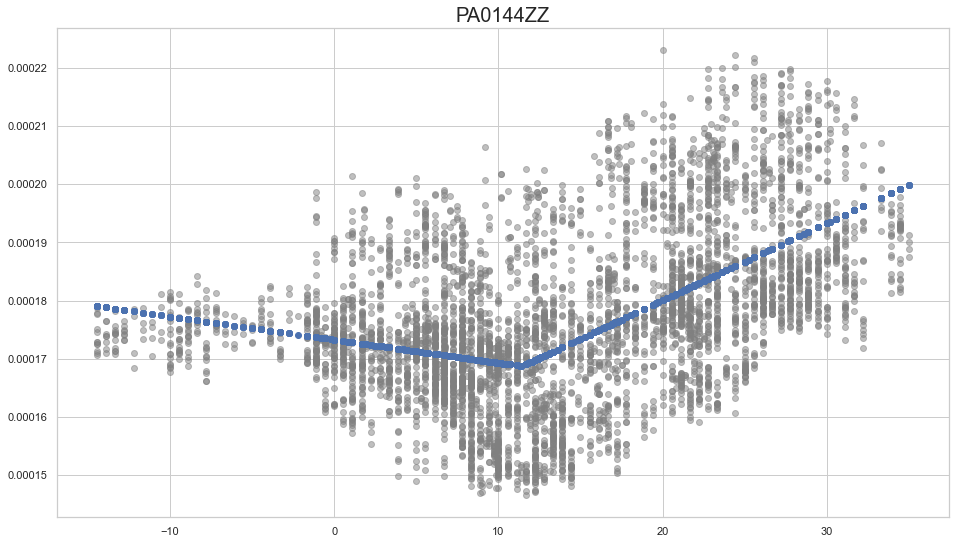

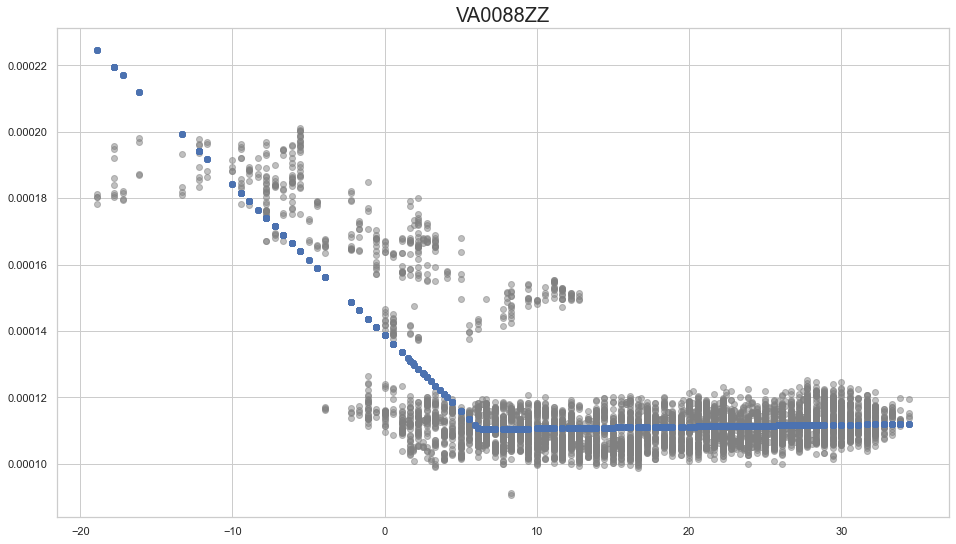

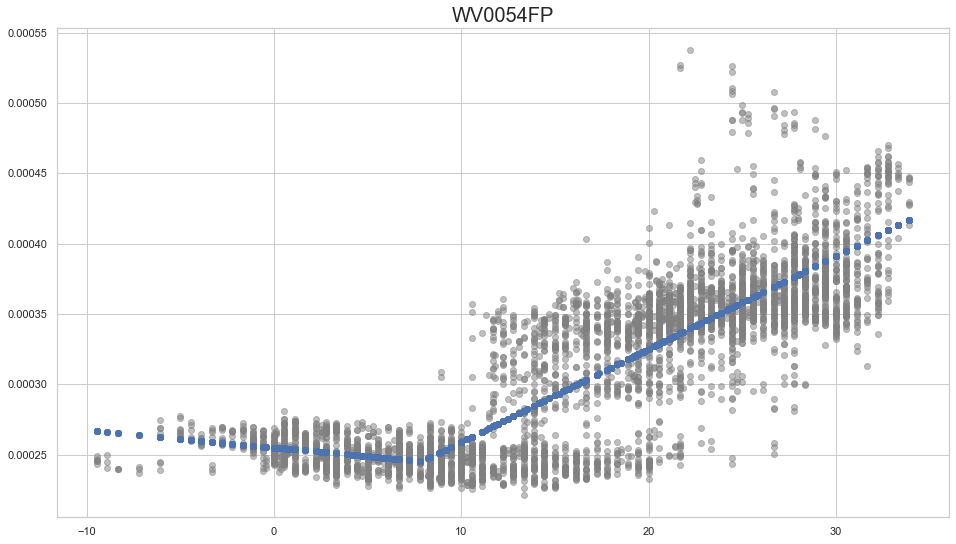

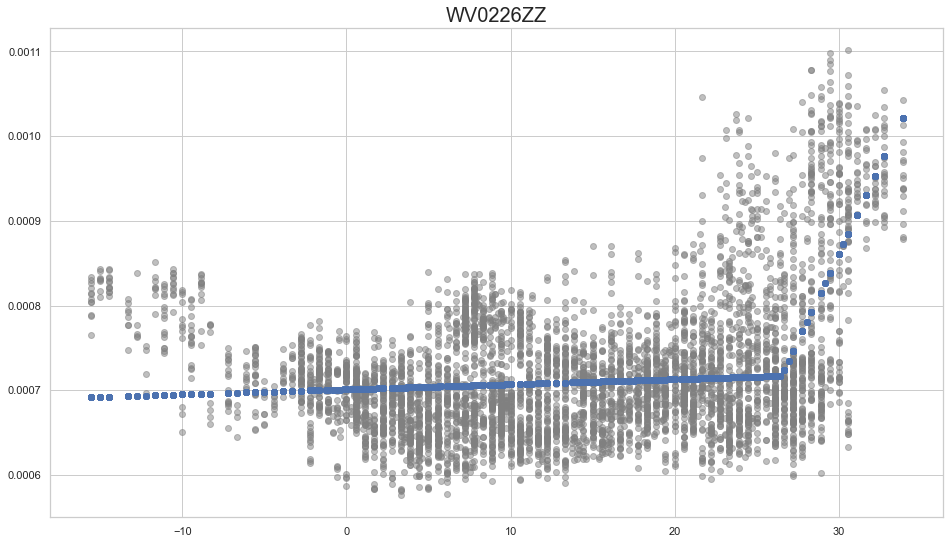

In [25]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[data.index.weekday >= 5].between_time('5:00', '19:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    plt.subplots()
    plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='gray', alpha=0.5)
    plt.scatter(x, f.predict(x))
    plt.title(f'{i}', fontsize=20)

In [18]:
sns.set_style("whitegrid")
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
#     data = data[data > 0]
    data = data.dropna()
    data = data[data.index.weekday >= 5].between_time('5:00', '17:00')
    
    clustering = DBSCAN(eps=5, min_samples=5).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    x_ = np.linspace(-10, 35, 100)
    plt.plot(x_, f.predict(x_), label=i, alpha=0.7, lw=8)
    plt.legend(loc='upper right')
    plt.title(f'Lean Analysis - Workday from 5:00 to 17:00', fontsize=20)
    plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
    plt.xlabel('Temperature C', fontsize=16)
#     plt.ylim(0, 0.00175)

NameError: name 'segment' is not defined

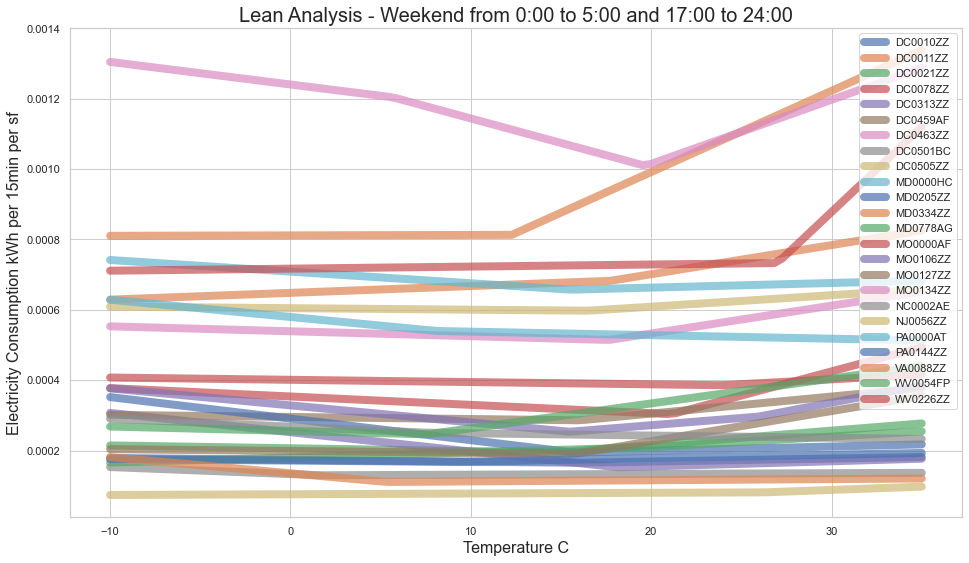

In [26]:
sns.set_style("whitegrid")
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
#     data = data[data > 0]
    data = data.dropna()
    data = data[data.index.weekday >= 5].between_time('17:00', '5:00')
    
    clustering = DBSCAN(eps=5, min_samples=5).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    x_ = np.linspace(-10, 35, 100)
    plt.plot(x_, f.predict(x_), label=i, alpha=0.7, lw=8)
    plt.legend(loc='upper right')
    plt.title(f'Lean Analysis - Weekend from 0:00 to 5:00 and 17:00 to 24:00', fontsize=20)
    plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
    plt.xlabel('Temperature C', fontsize=16)
#     plt.ylim(0, 0.00175)

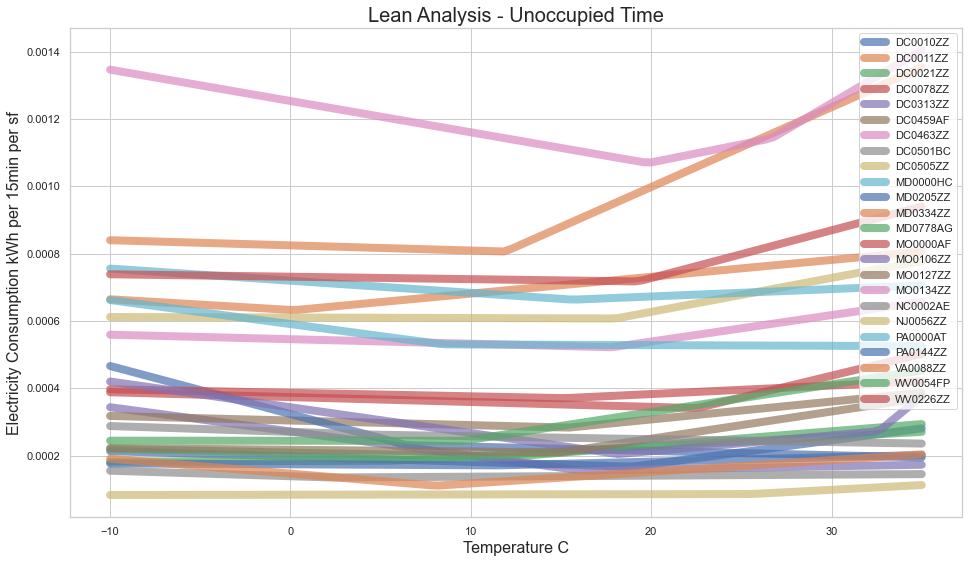

In [45]:
sns.set_style("whitegrid")
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    a = data[data.index.weekday >=5]
    b = data[data.index.weekday < 5].between_time('20:00', '4:00')
    data = pd.concat([a, b])
    
    clustering = DBSCAN(eps=5, min_samples=5).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    x_ = np.linspace(-10, 35, 100)
    plt.plot(x_, f.predict(x_), label=i, alpha=0.7, lw=8)
    plt.legend(loc='upper right')
    plt.title(f'Lean Analysis - Unoccupied Time', fontsize=20)
    plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
    plt.xlabel('Temperature C', fontsize=16)

In [38]:
data = pd.DataFrame()
data['w'] = w['DC0010ZZ']
data['e'] = e['DC0010ZZ']

In [39]:
a = data[data.index.weekday >=5]
b = data[data.index.weekday < 5].between_time('20:00', '4:00')

In [44]:
pd.concat([a, b])

,w,e
Timestamp,,
2018-01-06 00:00:00,-9.44,169.718
2018-01-06 00:15:00,-9.44,170.761
2018-01-06 00:30:00,-9.44,168.442
2018-01-06 00:45:00,-9.44,169.188
2018-01-06 01:00:00,-9.44,168.789
...,...,...
2018-12-31 22:45:00,9.78,NaN
2018-12-31 23:00:00,10.00,NaN
2018-12-31 23:15:00,10.00,NaN


## unoccupied breakpoint - clean

In [46]:

for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    a = data[data.index.weekday >=5]
    b = data[data.index.weekday < 5].between_time('20:00', '4:00')
    data = pd.concat([a, b])
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e']
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    _, *breakpoints, _ = f.fit_breaks
    print(i, breakpoints)

/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0010ZZ [19.009381422410012]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0011ZZ [0.07748870344098564]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0021ZZ [12.425749543898192]
DC0078ZZ [22.759320661708173]
DC0313ZZ [16.23459832188416]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0459AF [15.449480701072622]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0463ZZ [17.768187167944404]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0501BC [2.2200000171087497]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0505ZZ [17.622321299903142]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MD0000HC [8.669456403339437]
MD0205ZZ [6.861565071807532]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MD0334ZZ [12.132147125193354]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MD0778AG [15.5600204763336]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MO0000AF [15.228636800980158]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MO0106ZZ [18.704200021033426, 32.2200001091585]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MO0127ZZ [15.304867855453503]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MO0134ZZ [20.55999999933756, 29.853630372233646]
NC0002AE [4.870701120828563]
NJ0056ZZ [25.241531054636585]
PA0000AT [16.10668945886025]
PA0144ZZ [11.245089146234452]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


VA0088ZZ [8.039881855862433]
WV0054FP [9.305017159082926]
WV0226ZZ [19.193617239004805]


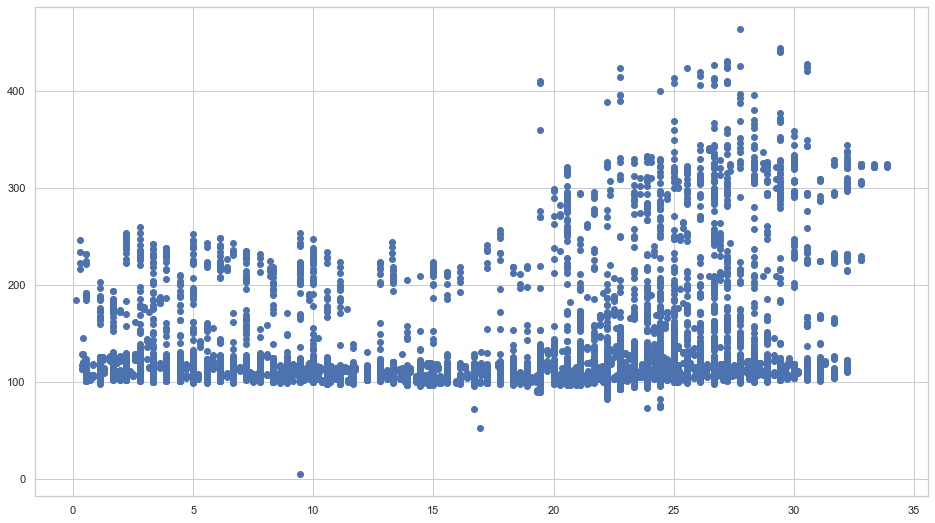

In [49]:
data = pd.DataFrame()
data['w'] = w['DC0010ZZ']
data['e'] = e['DC0010ZZ']
data = data[data>0]
data = data.dropna()
a = data[data.index.weekday >=5]
b = data[data.index.weekday < 5].between_time('20:00', '4:00')
data = pd.concat([a, b])
x, y = (data)['w'], (data)['e']
plt.scatter(x, y)

## unoccupied without clean

In [47]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data[data>0]
    data = data.dropna()
    a = data[data.index.weekday >=5]
    b = data[data.index.weekday < 5].between_time('20:00', '4:00')
    data = pd.concat([a, b])
    
    data['e'] = data['e']
    
    x, y = (data)['w'], (data)['e']
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(DC0010ZZ)
    _, *breakpoints, _ = f.fit_breaks
    print(i, breakpoints)

/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0010ZZ [31.218022956918634]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0011ZZ [22.4999999842581]
DC0021ZZ [13.51499344705564]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0078ZZ [22.780002180084995]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0313ZZ [17.46987333921284]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0459AF [11.629690589024683]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0463ZZ [18.476285323576395]
DC0501BC [25.325959496172704]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


DC0505ZZ [14.209668937679094]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MD0000HC [9.380116036205914]
MD0205ZZ [14.260426024080683]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(
/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MD0334ZZ [12.96668244490535]
MD0778AG [16.69283018014657]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MO0000AF [11.540075754139629]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MO0106ZZ [18.089487076185698, 32.2424911157561]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MO0127ZZ [22.65867487533224]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(
/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


MO0134ZZ [18.61094522029538, 29.7864294354293]
NC0002AE [14.440001499614695]
NJ0056ZZ [22.008614759815963]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(
/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


PA0000AT [7.315989166145723]
PA0144ZZ [9.999997660337616]
VA0088ZZ [26.632995942152494]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


WV0054FP [9.390777910395526]
WV0226ZZ [21.36233329579691]


/Users/tianjinzhao/opt/anaconda3/lib/python3.8/site-packages/pwlf/pwlf.py:1086: RuntimeWarning: invalid value encountered in true_divide
  self.slopes = np.divide(


In [65]:
data_agg = pd.DataFrame()
data_agg['Temperature'] = np.linspace(-20, 35, 100)

In [66]:
for i in list(segment.keys()):
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[data.index.weekday < 5].between_time('6:00', '16:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
    f = pwlf.PiecewiseLinFit(x, y)
    res = f.fit(segment[i])
    x_ = np.linspace(-20, 35, 100)
#     plt.plot(x_, f.predict(x_), label=i, alpha=0.7, lw=8)
    data_agg[i] = f.predict(x_)

In [67]:
fig = px.line(data_agg, x=data_agg['Temperature'], y=data_agg.columns[1:])
fig.update_xaxes(title_text='Temperature C')
fig.update_yaxes(title_text='Electiricy Consumption per sf kWh 15min/sf')

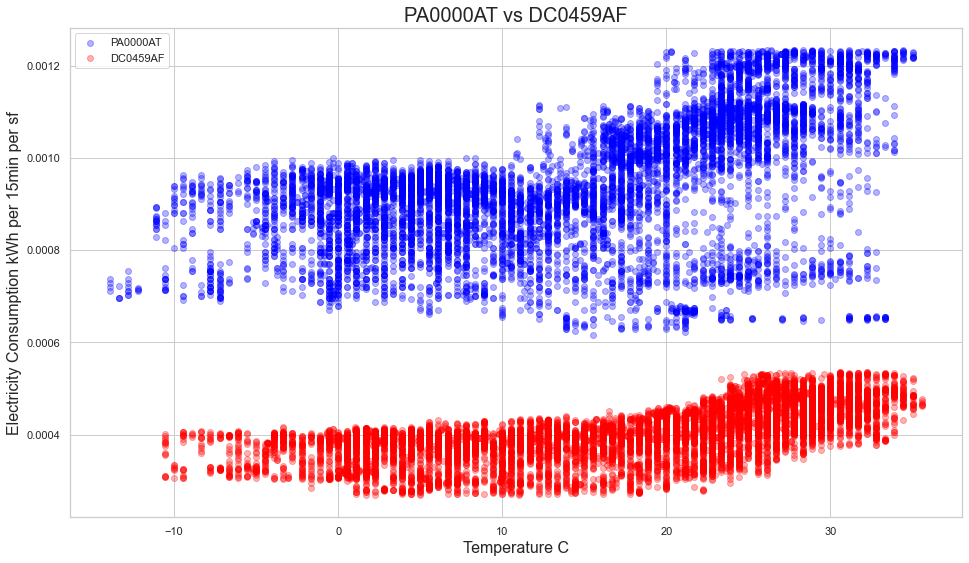

In [70]:
for i in ['PA0000AT', 'DC0459AF']:
    data = pd.DataFrame()
    data['w'] = w[i]
    data['e'] = e[i]
    data = data.dropna()
    data = data[data.index.weekday < 5].between_time('5:00', '19:00')
    
    clustering = DBSCAN(eps=5, min_samples=8).fit(data)
    res = np.unique(clustering.labels_, return_counts=True)
    maj = res[0][np.argmax(res[1])]
    
    data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == i].values[0])
    
    x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
#     f = pwlf.PiecewiseLinFit(x, y)
#     res = f.fit(segment[i])
    if i == 'PA0000AT':
        plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='blue', alpha=0.3, label='PA0000AT')
    else:
        plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='red', alpha=0.3, label='DC0459AF')
    plt.legend()
#     plt.scatter(x, f.predict(x))
    plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
    plt.xlabel('Temperature C', fontsize=16)
    plt.title('PA0000AT vs DC0459AF', fontsize=20)

Text(0.5, 1.0, 'Yearly Raw Data Comparison')

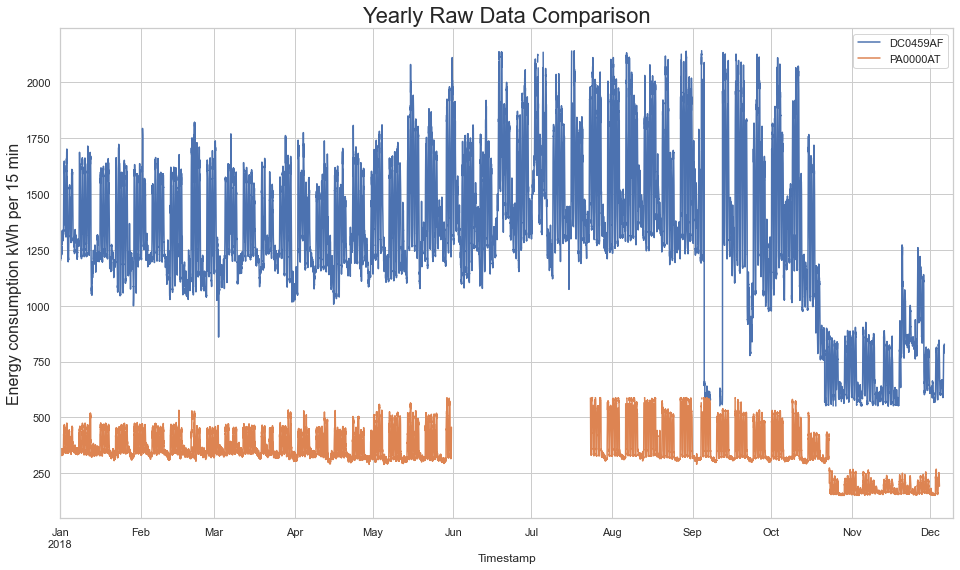

In [75]:
e['DC0459AF'].plot()
e['PA0000AT'].plot()
plt.ylabel('Energy consumption kWh per 15 min', fontsize=16)
plt.legend()
plt.title('Yearly Raw Data Comparison', fontsize=22)

In [72]:
comp = pd.DataFrame()

In [73]:
comp['DC0459AF'] = e['DC0459AF']/(building_info['floor area (sf)'][building_info['code'] == 'DC0459AF'].values[0])
comp['PA0000AT'] = e['PA0000AT']/(building_info['floor area (sf)'][building_info['code'] == 'DC0010ZZ'].values[0])

Text(0.5, 1.0, 'Yearly Normalized Data Comparison')

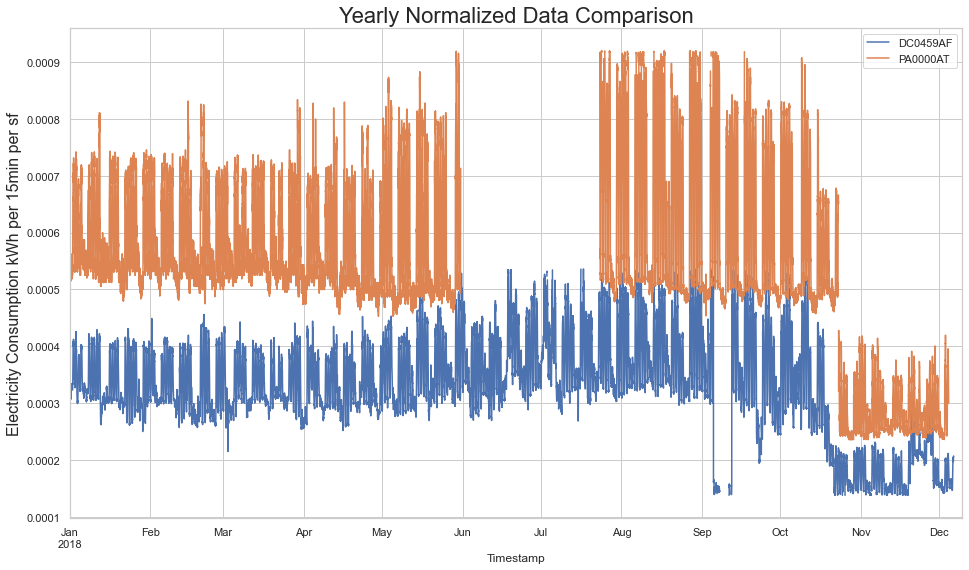

In [77]:
comp.plot()
plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
plt.title('Yearly Normalized Data Comparison', fontsize=22)

In [79]:
(w['PA0000AT'] == w['DC0459AF']).sum()

2456

In [80]:
data = pd.DataFrame()
data['w'] = w['DC0459AF']
data['e'] = e['DC0459AF']
data = data.dropna()
data = data[data.index.weekday < 5].between_time('5:00', '19:00')
    
clustering = DBSCAN(eps=5, min_samples=8).fit(data)
res = np.unique(clustering.labels_, return_counts=True)
maj = res[0][np.argmax(res[1])]
    
data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == 'DC0459AF'].values[0])
    
x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
f = pwlf.PiecewiseLinFit(x, y)
res = f.fit(segment['DC0459AF'])

Text(0.5, 1.0, 'PA0000AT(original) vs PA0000AT(learned from DC0459AF)')

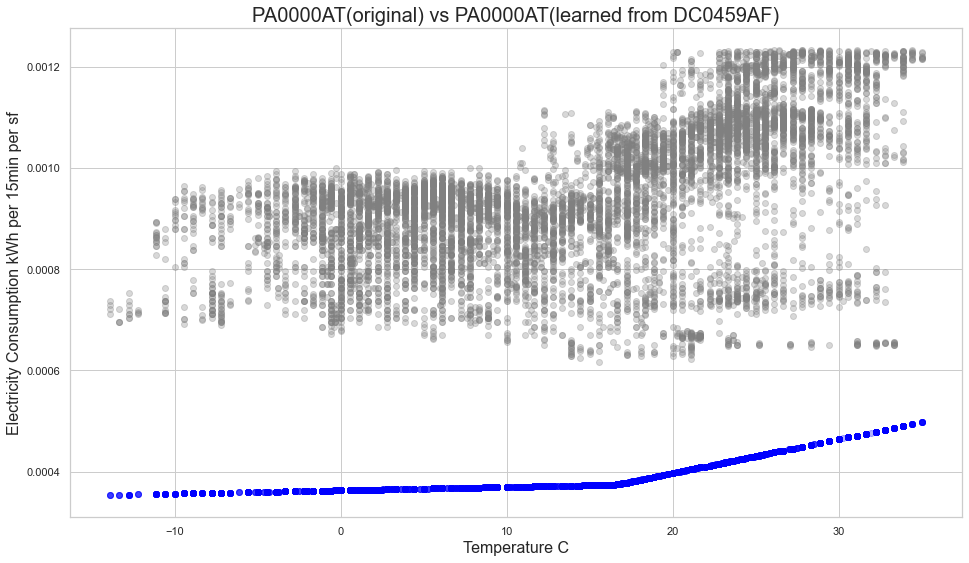

In [82]:
data = pd.DataFrame()
data['w'] = w['PA0000AT']
data['e'] = e['PA0000AT']
data = data.dropna()
data = data[data.index.weekday < 5].between_time('5:00', '19:00')
    
clustering = DBSCAN(eps=5, min_samples=8).fit(data)
res = np.unique(clustering.labels_, return_counts=True)
maj = res[0][np.argmax(res[1])]
    
data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == 'PA0000AT'].values[0])
plt.scatter((data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj], c='grey', alpha=0.3, label='PA0000AT original')
plt.scatter((data)['w'][clustering.labels_== maj], f.predict((data)['w'][clustering.labels_== maj]), c='blue', alpha=0.3, label='PA0000AT after_learn')
plt.ylabel('Electricity Consumption kWh per 15min per sf', fontsize=16)
plt.xlabel('Temperature C', fontsize=16)
plt.title('PA0000AT(original) vs PA0000AT(learned from DC0459AF)', fontsize=20)

In [85]:
f.predict((data)['w'][clustering.labels_== maj]).sum() * (building_info['floor area (sf)'][building_info['code'] == 'PA0000AT'].values[0])

1785530.2734300531

In [86]:
e['PA0000AT'].sum()

9453512.874

In [87]:
data = pd.DataFrame()
data['w'] = w['PA0000AT']
data['e'] = e['PA0000AT']
data = data.dropna()
data = data[data.index.weekday < 5].between_time('5:00', '19:00')
    
clustering = DBSCAN(eps=5, min_samples=8).fit(data)
res = np.unique(clustering.labels_, return_counts=True)
maj = res[0][np.argmax(res[1])]
    
data['e'] = data['e'] / (building_info['floor area (sf)'][building_info['code'] == 'PA0000AT'].values[0])
    
x, y = (data)['w'][clustering.labels_== maj], (data)['e'][clustering.labels_== maj]
f_ = pwlf.PiecewiseLinFit(x, y)
res = f_.fit(segment['PA0000AT'])

In [88]:
f_.predict((data)['w'][clustering.labels_== maj]).sum() * (building_info['floor area (sf)'][building_info['code'] == 'PA0000AT'].values[0])

4297144.894999997

In [96]:
data = {'x' : ['PA0000AT original','PA0000AT learned from DC0459AF'],
        'y' : [4297144.89, 1785530.27]}

AttributeError: 'AxesSubplot' object has no attribute 'bar_label'

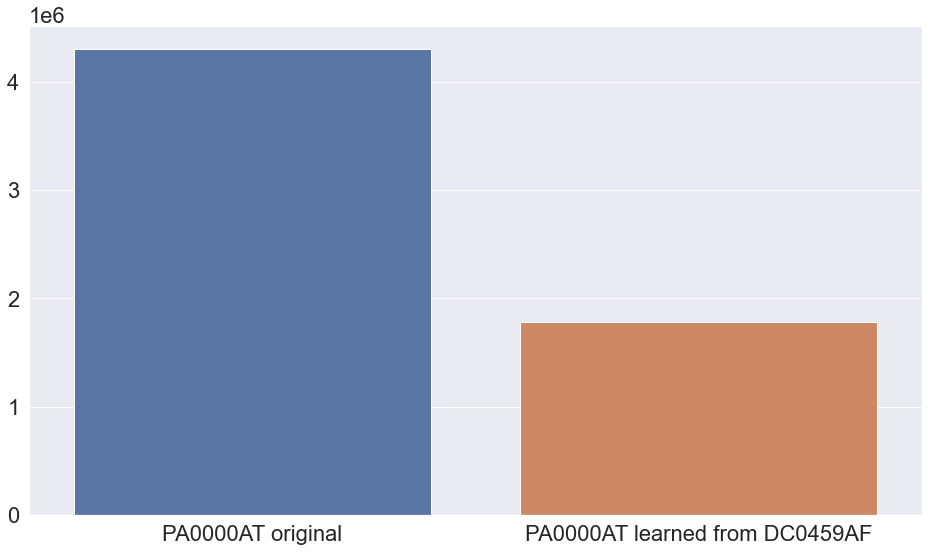

In [116]:
ax = sns.barplot(x = 'x',
            y = 'y',
            data = data)
ax.bar_label(ax.containers[0])

In [117]:
(4297144.89 - 1785530.27)/4297144.89

0.584484508736218